In [1]:
# Bruno Vieira Ribeiro - 2021

In [2]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import re
import nltk, pprint
from nltk import word_tokenize

In [3]:
%config Completer.use_jedi = False        # For autocomplete to work!

In [4]:
sns.set(rc={'figure.figsize': (10, 6)})
sns.set_style('whitegrid')
sns.set_palette('Set2')

# Importing and first look at the data

Let's get our dataframe ready:

In [5]:
with open('./data/df_atlk.data', 'rb') as filehandle:
    df_atlk = pickle.load(filehandle)

In [6]:
df_atlk.head()

,Character,script,ep_number,Book,total_number
0,NaN,The episode opens to footage of the sky while ...,1,1,1
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1
2,NaN,The man pushes open the door to grant the thre...,1,1,1
3,Senna,"[Briefly bowing her head, and tugging her righ...",1,1,1
4,NaN,A shield hanging on the wall falls down and ro...,1,1,1


In [7]:
df_atlk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9695 entries, 0 to 9694
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Character     7627 non-null   object
 1   script        9695 non-null   object
 2   ep_number     9695 non-null   int64 
 3   Book          9695 non-null   int64 
 4   total_number  9695 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 378.8+ KB


For quick check, let's load our episode number "guide":

In [8]:
with open('./data/korra_ep_names.data', 'rb') as filehandle:
    episode_guide = pickle.load(filehandle)

We can create a helper function to check epsiode name given the number and book:

In [9]:
def check_episode(ep_number, book):
    '''
    Helper function to return name of episode given the episode number and Book
    '''
    return episode_guide[(episode_guide['ep_number'] == ep_number)
                         & (episode_guide['Book'] == book)].iloc[0, 0]

In [10]:
check_episode(9, 2)

'The Guide'

Let's start by checking the value counts for Characters:

In [11]:
df_atlk['Character'].value_counts()

Korra                   1370
Mako                     791
Bolin                    682
Tenzin                   579
Asami                    328
                        ... 
Mako and Bolin             1
Female family member       1
Soldier #2                 1
Reporter #3                1
Bison rustler #2           1
Name: Character, Length: 311, dtype: int64

We can get our first visual on the top 10 characters with more lines in the show:

First, we select the top 10 values from the `value_counts()` function.

In [12]:
# Top 10 charcaters (in number of lines)
top_10_characters = df_atlk['Character'].value_counts()[:10]

Now we can simply plot this as a bar plot.

Text(0, 0.5, 'Number of lines')

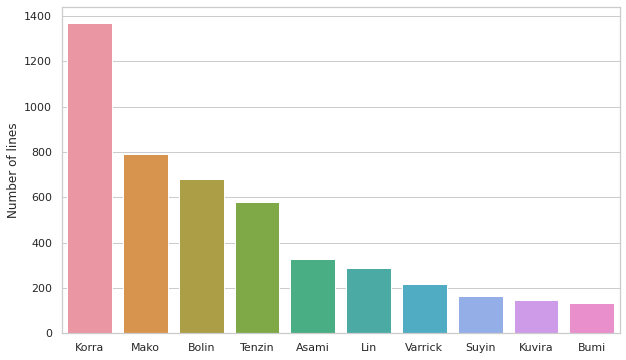

In [13]:
sns.barplot(x=top_10_characters.index, y=top_10_characters.values)
plt.ylabel('Number of lines')

Let's redo this with plotly for an awesome interaction.

In [14]:
fig = px.bar(top_10_characters, color=px.colors.qualitative.Light24[:10])
fig.update_layout(showlegend=False,
                  title="Top 10 Characters with more lines",
                  xaxis_title="Character",
                  yaxis_title="Number of lines")
fig.show()

The data set has two types of entries in the `Character` column:
* Named characters: corresponds to actual character lines in the show.

* NaN values: corresponding to scene descriptions.

I'll separate our data in two different dataframes, one for the lines and other for the descriptions.

In [15]:
df_description = df_atlk[df_atlk['Character'].isnull()]

In [16]:
df_lines = df_atlk[~df_atlk['Character'].isnull()]

# Description dataset

Info on the description dataframe:

In [17]:
df_description.head()

,Character,script,ep_number,Book,total_number
0,NaN,The episode opens to footage of the sky while ...,1,1,1
2,NaN,The man pushes open the door to grant the thre...,1,1,1
4,NaN,A shield hanging on the wall falls down and ro...,1,1,1
6,NaN,Tonraq walks toward his wife and puts his hand...,1,1,1
10,NaN,"Suddenly, a slab of earth flies past the three...",1,1,1


In [18]:
df_description.tail()

,Character,script,ep_number,Book,total_number
9656,NaN,He wipes his tears away and pulls a remote fro...,13,4,52
9670,NaN,Cut to the decorated gate at the entrance to t...,13,4,52
9679,NaN,Tenzin puts a reassuring hand on Korra's shoul...,13,4,52
9693,NaN,"Fade to the base of the new spirit portal, whe...",13,4,52
9694,NaN,Roll credits.,13,4,52


In [19]:
# Size of the description dataframe
len(df_description)

2068

In [20]:
# Size of the lines dataframe
len(df_lines)

7627

In [21]:
print(60 * '=')
print('Percentage of data corresponding to charcater lines:',
      round(100 * (len(df_lines) / len(df_atlk)), 2), '%')
print()
print('Percentage of data corresponding to description text:',
      round(100 * (len(df_description) / len(df_atlk)), 2), '%')
print(60 * '=')

Percentage of data corresponding to charcater lines: 78.67 %

Percentage of data corresponding to description text: 21.33 %


Let's check how many description lines we have per `Book`.

In [22]:
description_per_book = df_description.groupby(
    'Book')['script'].count().reset_index()

In [23]:
description_per_book

,Book,script
0,1,604
1,2,422
2,3,488
3,4,554


In [25]:
fig = px.bar(description_per_book,
             color=px.colors.qualitative.Light24[:4],
             x='Book',
             y='script')
fig.update_layout(showlegend=False,
                  title="Number of description lines per Book",
                  xaxis_title="Book",
                  yaxis_title="Number of lines")
fig.show()

We will work, mainly, with the `lines` dataframe, so let's start our preprocessing there.

# Preprocessing the character lines

In [26]:
df_lines.head()

,Character,script,ep_number,Book,total_number
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1
3,Senna,"[Briefly bowing her head, and tugging her righ...",1,1,1
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1
7,Senna,"[Happily.] Then you should be happy to know, y...",1,1,1
8,White Lotus leader,[Close-up of his unimpressed face.] What makes...,1,1,1


Many lines have descriptions closed between [ ]. We can remove these using a simple regex expression to analyse only the actual lines.

In [27]:
# Test case
test = df_lines.iloc[1]['script']

In [28]:
test

'[Briefly bowing her head, and tugging her right braid behind her ear.] Welcome.'

In [29]:
# Regex sub() method to find and replace expression between [ ]
test = re.sub("\[.*?\]", "", test)

In [30]:
test

' Welcome.'

In [31]:
df_lines['script'] = df_lines['script'].apply(
    lambda s: re.sub("\[.*?\]", "", s))

<ipython-input-31-5658146f0d4a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
df_lines.head()

,Character,script,ep_number,Book,total_number
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1
3,Senna,Welcome.,1,1,1
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1
7,Senna,"Then you should be happy to know, your search...",1,1,1
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1


Let's try a quick look at the distribution of character lines. We'll create a `text` object with the sequence of characters as they appear in the `Character` column. To match a `tokenized` text, we can simply create a list of entries from our `Character` Series.

In [33]:
char_seq = df_lines['Character'].tolist()

In [34]:
type(char_seq)

list

In [35]:
type(char_seq[0])

str

In [36]:
char_seq[:20]

['Tonraq',
 'Senna',
 'White Lotus leader',
 'Senna',
 'White Lotus leader',
 'Senna',
 'Korra',
 'Katara',
 'White Lotus leader',
 'Korra',
 'Firebending master',
 'White Lotus leader',
 'Korra',
 'White Lotus leader',
 'Katara',
 'White Lotus leader',
 'Korra',
 'Korra',
 'Korra',
 'Korra']

Ok, so our `char_seq` object is a list of strings containing names of Characters as they have lines in the show. We want to turn this into a `Text` object from nltk:

In [37]:
char_seq_text = nltk.Text(char_seq)

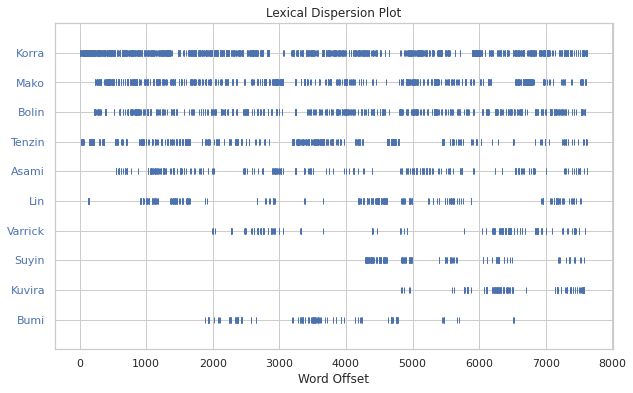

In [38]:
# char_seq_text.dispersion_plot(
#         ["Aang", "Katara", "Sokka", "Toph", "Zuko", "Iroh"]
#                     )
char_seq_text.dispersion_plot(list(top_10_characters.index))

This is a frist intersting visual on the distribution of lines in the show. For example, we can see that Tenzin's lines get sparser by the end of the show.

Let's just see how many total lines the show has:

In [39]:
len(df_lines)

7627

## Converting to lower case

In [40]:
df_lines.columns

Index(['Character', 'script', 'ep_number', 'Book', 'total_number'], dtype='object')

From this point on we'll do actual modifications (not just removing parts) in the `script`. So, we'll create a separate column called `script_clean` to do all the preprocessing steps.

In [41]:
df_lines['script_clean'] = df_lines['script'].str.lower()

<ipython-input-41-34a63d38e1bb>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [42]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,the white lotus has honored my family by comin...
3,Senna,Welcome.,1,1,1,welcome.
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,"we have investigated many claims, both here an..."
7,Senna,"Then you should be happy to know, your search...",1,1,1,"then you should be happy to know, your search..."
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,what makes you so sure your daughter is the one?


## Removing punctuation

We'll replace everything that's not alphanumeric or whitespace with an empty character:

In [43]:
df_lines['script_clean'] = df_lines['script_clean'].str.replace('[^\w\s]', '')

<ipython-input-43-cb4e8b5d0893>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,the white lotus has honored my family by comin...
3,Senna,Welcome.,1,1,1,welcome
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,we have investigated many claims both here and...
7,Senna,"Then you should be happy to know, your search...",1,1,1,then you should be happy to know your search ...
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,what makes you so sure your daughter is the one


## Removing stopwords

We'll use `nltk`'s stopwords to remove all english stopwords from character lines.

In [45]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/bruno/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [47]:
from nltk.corpus import stopwords

Inspecting the results way down the road, I have also found some common words in the show that can be removed and not alter the content of the lines. I'll include these as stop word here too.

In [48]:
stop_words = set(stopwords.words('english'))

In [49]:
newer_stopwords = ["that", "go", "yeah", "uh", "oh", "let", "hey", "okay"]
new_stopwords_list = stop_words.union(newer_stopwords)

new_stop_words = set(
    [word for word in new_stopwords_list if word not in {'not'}])

In [50]:
df_lines['script_clean'] = df_lines['script_clean'].apply(
    lambda s: " ".join(s for s in word_tokenize(s) if s not in new_stop_words))

<ipython-input-50-c8c7454b9cd8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [51]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotus honored family coming thank
3,Senna,Welcome.,1,1,1,welcome
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investigated many claims northern tribe turned...
7,Senna,"Then you should be happy to know, your search...",1,1,1,happy know search come end
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,makes sure daughter one


## Word frequency

We have enough to check for the most common words in the show before digging deep in indivudal characters.

In [52]:
freq = pd.Series(' '.join(df_lines['script_clean']).split()).value_counts()

In [53]:
freq[:20]

im        772
not       568
know      540
dont      529
youre     515
get       488
right     385
like      381
avatar    373
korra     371
us        306
think     301
well      293
back      289
one       279
going     270
need      269
got       259
want      257
time      254
dtype: int64

In [54]:
freq

im            772
not           568
know          540
dont          529
youre         515
             ... 
halfsister      1
sayso           1
pulls           1
cameras         1
whaletail       1
Length: 6282, dtype: int64

In [55]:
fig = px.bar(freq[:20])
fig.update_layout(showlegend=False,
                  title="Most frequent words",
                  xaxis_title="Word",
                  yaxis_title="Frequency")
fig.show()

Let's check out the **rare** words (the ones that appear only once):

In [56]:
rare_words = list(freq[freq == 1].index)

In [57]:
rare_words

['enlightened',
 'whip',
 'pfuh',
 'roof',
 'decay',
 'inclined',
 'wallets',
 'oof',
 'interplanetary',
 'challenging',
 'aspect',
 'restaurant',
 'propellers',
 'offering',
 'humiliating',
 'operative',
 'elevator',
 'relieved',
 'nobility',
 'tank',
 'forfeit',
 'zip',
 'penguins',
 'kisses',
 'deduction',
 'channeling',
 'whooooos',
 'sailors',
 'iiiiits',
 'framed',
 'country',
 'market',
 'allexpense',
 'zilch',
 'exceeding',
 'cripple',
 'slammer',
 'extinction',
 'seared',
 'fulfilling',
 'nutritious',
 'lemon',
 'boyfriends',
 'medium',
 'mob',
 'republics',
 'replace',
 'hitting',
 'dhaaah',
 'transmitter',
 'results',
 'dissidents',
 'remotely',
 'beg',
 'pale',
 'overdramatic',
 'fury',
 'detail',
 'nagas',
 'eeeh',
 'compassion',
 'episode',
 'damages',
 'representatives',
 'coulda',
 'outfit',
 'laundry',
 'bravest',
 'veggie',
 'reserved',
 'thoughtful',
 'eee',
 'bragging',
 'neutralize',
 'sail',
 'unannounced',
 'corralled',
 'prime',
 'retrace',
 'princely',
 'tapped

In [58]:
len(rare_words)

2961

## Stemming (and Lemmatization)

Let's start with stemming using the PorterStemmer from `nltk`:

In [59]:
from nltk.stem import PorterStemmer

In [60]:
st = PorterStemmer()

In [61]:
df_lines['script_clean'] = df_lines['script_clean'].apply(
    lambda s: ' '.join([st.stem(word) for word in word_tokenize(s)]))

<ipython-input-61-f818ababb077>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotu honor famili come thank
3,Senna,Welcome.,1,1,1,welcom
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investig mani claim northern tribe turn fals
7,Senna,"Then you should be happy to know, your search...",1,1,1,happi know search come end
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,make sure daughter one


Now to lemmatize:

In [63]:
# from nltk.stem import WordNetLemmatizer

In [64]:
# nltk.download(['wordnet', 'punkt'])

In [65]:
# lemmatizer = WordNetLemmatizer()

In [66]:
# df_lines['script_clean'] = df_lines['script_clean'].apply(lambda s: ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(s)]))

In [67]:
# df_lines.head()

# Adding `polarity`, `subjectivity` and `word_count` as new features

We'll now use `textblob` to easily create new features, namely:

* `polarity`: Return the polarity score as a float within the range [-1.0, 1.0]. -1.0 refers to a very negative text, and 1.0 a very positive one.
* `subjectivity`: Return the subjectivity score as a float within the range [0.0, 1.0] where 0.0 is very objective and 1.0 is very subjective.
* `word_count`: word frequency in this text.

(All descriptions taken from the documentation [here](https://textblob.readthedocs.io/en/dev/api_reference.html#textblob.blob.TextBlob.sentiment))


In [68]:
from textblob import TextBlob, Word, Blobber

In [69]:
df_lines['polarity'] = df_lines['script'].map(
    lambda text: TextBlob(text).sentiment.polarity)

<ipython-input-69-a5a5c72e37ae>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
df_lines['subjectivity'] = df_lines['script'].map(
    lambda text: TextBlob(text).sentiment.subjectivity)

<ipython-input-70-f00de1dcdf73>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:
df_lines['word_count'] = df_lines['script'].apply(
    lambda s: len(word_tokenize(s)))

<ipython-input-71-12ba04c2573c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [72]:
df_lines.head(20)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotu honor famili come thank,0.000000,0.000000,13
3,Senna,Welcome.,1,1,1,welcom,0.800000,0.900000,2
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investig mani claim northern tribe turn fals,0.050000,0.550000,22
7,Senna,"Then you should be happy to know, your search...",1,1,1,happi know search come end,0.800000,1.000000,16
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,make sure daughter one,0.500000,0.888889,11
9,Senna,Korra! Please come in here!,1,1,1,korra pleas come,0.000000,0.000000,7
11,Korra,I'm the Avatar! You gotta deal with it!,1,1,1,im avatar got ta deal,0.000000,0.000000,12
13,Katara,She's strong.,1,1,1,she strong,0.433333,0.733333,4
14,White Lotus leader,She lacks restraint.,1,1,1,lack restraint,0.000000,0.000000,4
16,Korra,"Woohoo! Hey, why all the doom and gloom, peo...",1,1,1,woohoo doom gloom peopl celebr three element one,-0.180556,0.211111,26


For the whole cast of characters we can see the distribution of these newly create features:

array([[<AxesSubplot:title={'center':'word_count'}>,
        <AxesSubplot:title={'center':'polarity'}>],
       [<AxesSubplot:title={'center':'subjectivity'}>, <AxesSubplot:>]],
      dtype=object)

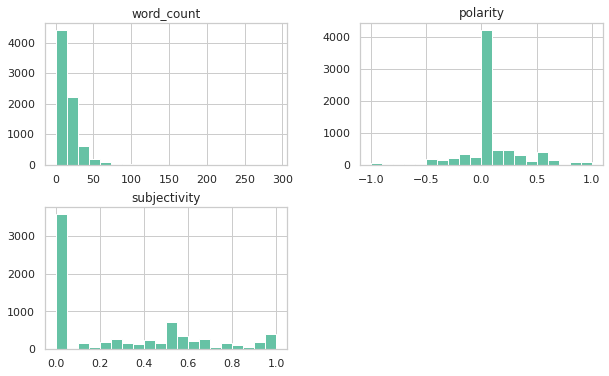

In [73]:
df_lines[['word_count', 'polarity', 'subjectivity']].hist(bins=20)

Using only words that appear more than 30 times:

array([[<AxesSubplot:title={'center':'word_count'}>,
        <AxesSubplot:title={'center':'polarity'}>],
       [<AxesSubplot:title={'center':'subjectivity'}>, <AxesSubplot:>]],
      dtype=object)

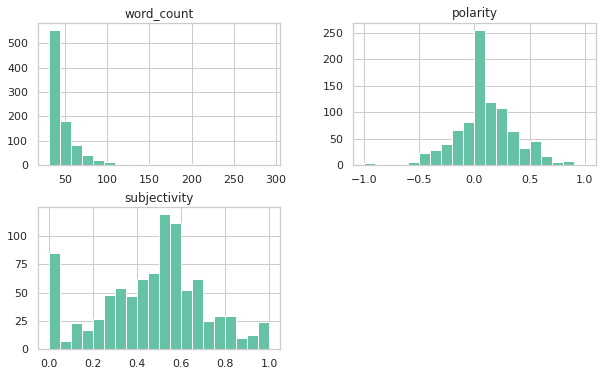

In [74]:
df_lines[df_lines['word_count'] > 30][[
    'word_count', 'polarity', 'subjectivity'
]].hist(bins=20)

## Exploring `polarity`, `subjectivity` and `word_count`

We can create a function to display distribution of word_count, polarity and subjectivity for a given character and given cut-off word_count

In [75]:
# Create a function to display distribution of word_count, polarity and subjectivity for a given character
# and given cut-off word_count
def plot_character_dists(characters, cut_off_word_count=0, bins=10):
    '''
    Plots histograms of word_count, polarity and sensitivity for all characetrs in characters.
    * characters is a tuple with all characters to be included.
    * cut_off_word_count is the minimum value of word_count to be included in the statistic
    * bins is the number of bins to plot
    '''
    df_lines[(df_lines['Character'].isin(characters))
             & (df_lines['word_count'] > cut_off_word_count)][[
                 'word_count', 'polarity', 'subjectivity'
             ]].hist(bins=bins)

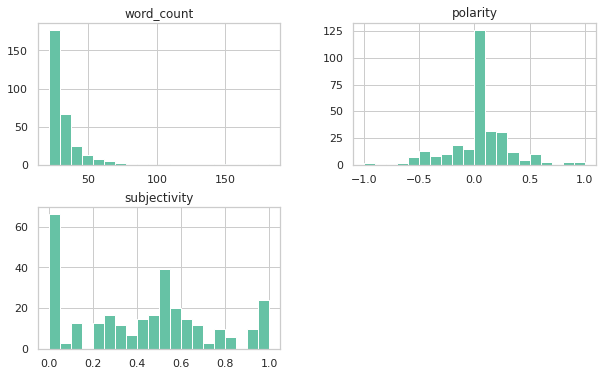

In [76]:
plot_character_dists(['Korra'], cut_off_word_count=20, bins=20)

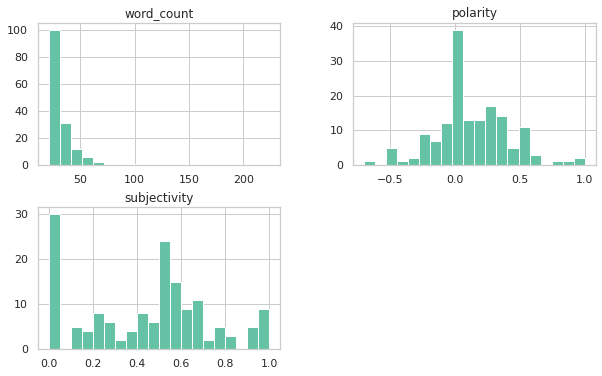

In [77]:
plot_character_dists(['Tenzin'], cut_off_word_count=20, bins=20)

In [78]:
# tuple(top_10_characters.index)

Let's see the distributions for all top 10 characters with more lines:

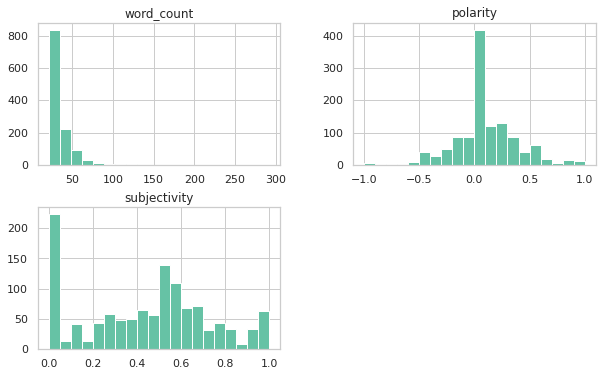

In [79]:
plot_character_dists(tuple(top_10_characters.index),
                     cut_off_word_count=20,
                     bins=20)

In [80]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotu honor famili come thank,0.00,0.000000,13
3,Senna,Welcome.,1,1,1,welcom,0.80,0.900000,2
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investig mani claim northern tribe turn fals,0.05,0.550000,22
7,Senna,"Then you should be happy to know, your search...",1,1,1,happi know search come end,0.80,1.000000,16
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,make sure daughter one,0.50,0.888889,11


To better explore different characetrs let's group by `Character` and inspect our newly created features.

In [81]:
by_character = df_lines.groupby('Character')[[
    'polarity', 'subjectivity', 'word_count'
]].mean().reset_index()

In [84]:
by_character.head()

,Character,polarity,subjectivity,word_count
0,Aang,0.170312,0.342708,14.125000
1,Aang's image,-0.028571,0.283929,18.500000
2,Acolyte,-0.185417,0.647917,10.750000
3,Ahnah,-0.041667,0.175000,16.333333
4,Air Acolyte member,0.000000,0.000000,10.000000


In [86]:
fig = px.bar(
    by_character, x='Character', y='polarity',
    title='Mean Polarity').update_xaxes(categoryorder="total descending")
fig.show()

Ok, so there are waaaay too many names here. Let's focus our analysis on the top 10 characters:

In [87]:
by_character_top10 = df_lines[(df_lines['Character'].isin(
    tuple(top_10_characters.index)))].groupby('Character')[[
        'polarity', 'subjectivity', 'word_count'
    ]].mean().reset_index()
by_character_top10

,Character,polarity,subjectivity,word_count
0,Asami,0.081019,0.290200,13.484756
1,Bolin,0.093987,0.346280,18.573314
2,Bumi,0.066000,0.282847,16.750000
3,Korra,0.049647,0.279870,14.645255
4,Kuvira,0.075093,0.291954,22.716216
5,Lin,0.067258,0.268962,14.114983
6,Mako,0.049664,0.255206,14.049305
7,Suyin,0.105126,0.303798,19.533742
8,Tenzin,0.087770,0.304402,16.459413
9,Varrick,0.106130,0.390700,25.958716


This is much better! Let's see which character has the highest `polarity`. This is a value between -1 and 1 indicating how positive a statement is. Value 1 means a very positive sentence whereas -1 means a very negative one.

In [88]:
fig = px.bar(
    by_character_top10, x='Character', y='polarity',
    title='Mean Polarity').update_xaxes(categoryorder="total descending")
fig.show()

Not surprisingly, Varrick tops the list (nothing like a crazy rich guy to be always positive!). Again, not surprisingly, Korra stands out as the most negative out of these characters, in average.

We can do the same for `Subjectivity` and `Word Count`.

In [89]:
fig = px.bar(
    by_character_top10,
    x='Character',
    y='subjectivity',
    title='Mean Subjectivity').update_xaxes(categoryorder="total descending")
fig.show()

Varrick, again, tops the list as the least objective character. He is very weird and often talks too much, so makes sense...

Now onto the word count stats:

In [90]:
fig = px.bar(
    by_character_top10, x='Character', y='word_count',
    title='Mean Word Count').update_xaxes(categoryorder="total descending")
fig.show()

There is Varrick again...

In [91]:
fig = px.histogram(df_lines[df_lines['Character'] == 'Korra'], x="word_count")
fig.show()

Wow, there is a huge line with over 180 words! Let's check it out:

In [92]:
df_lines[(df_lines['Character'] == 'Korra') & (df_lines['word_count'] > 180)]

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
4765,Korra,The war of the Water Tribes is over. Unalaq ha...,14,2,26,war water tribe unalaq defeat northern fleet r...,0.153598,0.400162,182


In [93]:
df_lines[(df_lines['Character'] == 'Korra')
         & (df_lines['word_count'] > 180)].iloc[0, 1]

"The war of the Water Tribes is over. Unalaq has been defeated, and the Northern fleet is returning home. The Water Tribes will always be allies, but the Southern Tribe is now independent,  and the Southern Council of Elders has appointed my father, Tonraq, to be your new chief!  I've realized that even though we should learn from those who came before us, we must also forge our own path. So that is why I've decided to keep the portals open. Humans can now physically enter the Spirit World, and spirits will be free to roam our world. I will no longer be the bridge. Humans and spirits must learn to live together. My mission will always be to use Raava's light spirit to guide the world toward peace and balance. Harmonic Convergence has caused a shift in the planet's energy. I can feel it. Things will never be the same again. We're entering a New Age."

Excluding this one, let's look at Korra's distribution of word count:

In [94]:
aang_lines = len(df_lines[(df_lines['Character'] == 'Korra')
                          & (df_lines['word_count'] < 180)])
fig = px.histogram(df_lines[(df_lines['Character'] == 'Korra')
                            & (df_lines['word_count'] < 180)],
                   x="word_count",
                   title=f'Korra - {aang_lines} lines')
fig.show()

Let's check Bolin's distribution:

In [96]:
bolin_lines = len(df_lines[df_lines['Character'] == 'Bolin'])
fig = px.histogram(df_lines[df_lines['Character'] == 'Bolin'],
                   x="word_count",
                   title=f'Bolin - {bolin_lines} lines')
fig.show()

In [95]:
# fig = px.histogram(df_lines[(df_lines['Character']=='Aang') & (df_lines['word_count']>20)], x="polarity")
# fig.show()

## Polarity across episodes

For a given character let's see if we can get a nice visual on the evolution of hers(his) polarity across episodes.

We can start with Korra:

In [97]:
fig = px.line(df_lines[df_lines['Character'] == 'Korra'], y="polarity")
fig.show()

Ok, this is messy (even though we can see some patterns). We can try to see the mean value of polarity for each episode.

Let's try a simple approach:
* Select all of Korra's lines
* Group the df by `total_number`
* Get the mean of all numeric values.

This can be done in one line, as seen bellow:

In [98]:
korra_mean_values = df_lines[(
    df_lines['Character'] == 'Korra')].groupby('total_number')[[
        'ep_number', 'Book', 'polarity', 'subjectivity', 'word_count'
    ]].mean().reset_index()

korra_mean_values.head()

,total_number,ep_number,Book,polarity,subjectivity,word_count
0,1,1.0,1.0,0.071865,0.323726,17.050000
1,2,2.0,1.0,0.067585,0.291586,13.772727
2,3,3.0,1.0,0.016178,0.212247,10.188679
3,4,4.0,1.0,0.119583,0.315486,11.925000
4,5,5.0,1.0,0.128475,0.257700,14.372093


In [99]:
fig = px.line(korra_mean_values, y="polarity", hover_data=['ep_number', 'Book'])
fig.show()

What's going on with that one episode with super low polarity? You can check the episode's number and book by hovering over it (thanks plotly!):

In [100]:
check_episode(3, 4)

'The Coronation'

If you've watched the show you will remember this one as the one with old Toph. Korra is very sad all around this one:

In [101]:
df_lines[(df_lines['Character'] == 'Korra') & (df_lines['ep_number'] == 3) &
         (df_lines['Book'] == 4)]['script']

7654    You got to help me get back into Avatar fighti...
7656     But, while I've been the Avatar, I've stopped...
7658    So, basically, you're saying that everything I...
7660                 So ... you're not going to train me?
7662                                           Thank you!
7715               Well, I was thinking that you were ...
7719     Gah! Hey! It seems like you're enjoying havin...
7721    So ... what made you want to drop out and disc...
7788                                   That was terrible.
7790    You were tossing me around like a ragdoll all ...
7792    I just don't understand why I can't get back t...
7794                                          What metal?
7796                         I thought Su got it all out.
7798     That's been my problem this entire time! I go...
7825                                        I am relaxed.
7827                               Just do it! I'm ready.
7830                                    I'm not fighting!
7833    What d

### Polarity by episode for given character

Now, can we get this into a function for any given character? If so, can we create a dictionary with this dataframe for all top 10 characters with more lines?

In [102]:
def get_mean_per_episode(character):
    '''
    Returns the evolution of mean numeric values by episode for a given character
    '''
    char_mean_values = df_lines[(
        df_lines['Character'] == character)].groupby('total_number')[[
            'ep_number', 'Book', 'polarity', 'subjectivity', 'word_count'
        ]].mean().reset_index()

    return char_mean_values

In [103]:
top_10_mean_values = {}
for char in top_10_characters.index:
    top_10_mean_values[char] = get_mean_per_episode(char)

Let's check Bolin's polarity evolution, as he is very known to have a brilliant character development.

In [104]:
top_10_mean_values['Bolin']

,total_number,ep_number,Book,polarity,subjectivity,word_count
0,2,2.0,1.0,0.149097,0.368808,18.083333
1,3,3.0,1.0,0.028274,0.411872,19.285714
2,4,4.0,1.0,0.148284,0.253641,18.400000
3,5,5.0,1.0,0.125839,0.297063,18.450000
4,6,6.0,1.0,0.166610,0.249755,11.866667
5,7,7.0,1.0,0.208573,0.341667,13.866667
6,8,8.0,1.0,0.131007,0.301433,13.000000
7,9,9.0,1.0,-0.056154,0.325468,13.857143
8,10,10.0,1.0,0.566667,0.450000,11.000000
9,11,11.0,1.0,0.040438,0.431582,14.833333


In [105]:
fig = px.line(top_10_mean_values['Bolin'],
              y="polarity",
              hover_data=['ep_number', 'Book'])
fig.show()

We can create a helper function to return all info for a given character, given episode's number and book:

In [106]:
def get_character_lines(char, episode, book):
    '''
    Return a pandas dataframe with info on a given list of characters (char) for given book and episode
    '''
    return df_lines[(df_lines['Character'].isin(char))
                    & (df_lines['Book'] == book) &
                    (df_lines['ep_number'] == episode)]


def get_character_lines_episode(char, episode):
    '''
    Return a pandas dataframe with info on a given list of characters (char) for given episode number (1 to 61)
    '''
    return df_lines[(df_lines['Character'].isin(char))
                    & (df_lines['total_number'] == episode)]

In [107]:
# First high point:
get_character_lines(['Bolin'], 10, 1)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
2053,Bolin,All things considered you did a great job! Bu...,10,1,10,thing consid great job go pay park ticket,1.0,0.75,22
2059,Bolin,"Car! Oh, we're good.",10,1,10,car good,0.7,0.60,8
2156,Bolin,Mustache guy!,10,1,10,mustach guy,0.0,0.00,3


To get an overall view of the top 10 characters, we can build a cool visual showing all the evolutions of characters polarity per episode in a single graph. Using *plotly*, this can generate a clean, pretty and interactive figure:

In [110]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x=top_10_mean_values[char]['total_number'],
                    y=top_10_mean_values[char]['polarity'],
                    hovertext=list(
                        zip(top_10_mean_values[char]['ep_number'],
                            top_10_mean_values[char]['Book'])),
                    name=char)
fig.update_layout(
    title="Evolution of polarity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Mean polarity of lines",
    hovermode="x unified")

fig.add_vrect(
    # Add background color for Book 1
    x0=1,
    x1=12,
    fillcolor="LightBlue",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=12,
    x1=26,
    fillcolor="LightGreen",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=26,
    x1=39,
    fillcolor="Red",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 4
    x0=39,
    x1=52,
    fillcolor="LightYellow",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_annotation(x=4,
                   y=0.8,
                   text="Book 1",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="Blue"))
fig.add_annotation(x=14,
                   y=0.8,
                   text="Book 2",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="DarkGreen"))
fig.add_annotation(x=30,
                   y=0.8,
                   text="Book 3",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="crimson"))

fig.add_annotation(x=42,
                   y=0.8,
                   text="Book 4",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="sandybrown"))

fig.show()

Highest mean polarity happens for Tenzin in episode 5, book 4. Let's inspect that:

In [111]:
 check_episode(5,4)

'Enemy at the Gates'

In [112]:
get_character_lines(['Tenzin'], 5, 4)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
7969,Tenzin,You're the perfect person to take charge. The ...,5,4,44,your perfect person take charg world leader tr...,1.0,1.0,29


In [113]:
get_character_lines(['Tenzin'], 5, 4).iloc[0,1]

"You're the perfect person to take charge. The world leaders trust you, and, as a Beifong, you have credibility in the Earth Kingdom."

This is followed closely by Bumi on episode 13 from book 3:

In [114]:
get_character_lines(['Bumi'], 13, 3).iloc[0,1]

'What are you talking about? I feel great! '

The lowest mean polarity happens for Lin in book 2, episode 14:

In [115]:
 check_episode(14,2)

'Light in the Dark'

In [116]:
get_character_lines(['Lin'], 14, 2).iloc[0,1]

"We're going down!"

### Plotting subjectivity and word_count per episode

To see the same figure for other attributes (like `subjectivity` and `word_count`), we can turn this last cell into a function accepting the attribute as an input:

In [118]:
def plot_top10_evolution(attribute, ymax = 1):
    fig = go.Figure()

    for char in top_10_characters.index:

        fig.add_scatter(x = top_10_mean_values[char]['total_number'],
                        y = top_10_mean_values[char][attribute],
                        hovertext=list(zip(top_10_mean_values[char]['ep_number'],
                                      top_10_mean_values[char]['Book'])),
                        name = char)
    fig.update_layout(
        title="Evolution of "+ attribute +" - Top 10 Characters with more lines",
        xaxis_title="Episode number (in entire series)",
        yaxis_title="Mean "+attribute+" of lines"
    )
    fig.update_layout(hovermode="x unified")

    fig.add_vrect(
        # Add background color for Book 1
        x0=1,
        x1=12,
        fillcolor="LightBlue",
        opacity=0.5,
        layer="below",
        line_width=0,
    )

    fig.add_vrect(
        # Add background color for Book 2
        x0=12,
        x1=26,
        fillcolor="LightGreen",
        opacity=0.5,
        layer="below",
        line_width=0,
    )

    fig.add_vrect(
        # Add background color for Book 3
        x0=26,
        x1=39,
        fillcolor="Red",
        opacity=0.2,
        layer="below",
        line_width=0,
    )

    fig.add_vrect(
        # Add background color for Book 4
        x0=39,
        x1=52,
        fillcolor="LightYellow",
        opacity=0.2,
        layer="below",
        line_width=0,
    )

    fig.add_annotation(x=4,
                       y=0.8,
                       text="Book 1",
                       showarrow=False,
                       yshift=10,
                       font=dict(family="Courier New, monospace",
                                 size=16,
                                 color="Blue"))
    fig.add_annotation(x=14,
                       y=0.8,
                       text="Book 2",
                       showarrow=False,
                       yshift=10,
                       font=dict(family="Courier New, monospace",
                                 size=16,
                                 color="DarkGreen"))
    fig.add_annotation(x=30,
                       y=0.8,
                       text="Book 3",
                       showarrow=False,
                       yshift=10,
                       font=dict(family="Courier New, monospace",
                                 size=16,
                                 color="crimson"))

    fig.add_annotation(x=42,
                       y=0.8,
                       text="Book 4",
                       showarrow=False,
                       yshift=10,
                       font=dict(family="Courier New, monospace",
                                 size=16,
                                 color="sandybrown"))


    fig.show()

#### Subjectivity

In [119]:
plot_top10_evolution('subjectivity')

Highest mean subjectivity happens for Tenzin on book 4, episode 5:

In [120]:
check_episode(5,4)

'Enemy at the Gates'

In [121]:
get_character_lines(['Tenzin'], 5, 4).iloc[0,1]

"You're the perfect person to take charge. The world leaders trust you, and, as a Beifong, you have credibility in the Earth Kingdom."

This line has a `subjectivity` of 1.00. It is closely followed by Bolin on episode 7 in book 3. Let's chek it out:

In [122]:
get_character_lines(['Bolin'], 7, 3).iloc[0,1]

' She is wonderful, and pretty,  and so smart, and she smells like flowers ...  Sorry. Bolin, out. '

#### Word_count

In [123]:
plot_top10_evolution('word_count')

The only two characters to have over 40 words on average in a single episode are Varrick and Tenzin on book 4, episode 8. And, again, Tenzin on episode 13, book 3. Let's inspect:

In [124]:
check_episode(8, 4)

'Remembrances'

In [128]:
# get_character_lines(['Varrick'], 8, 4)

In [126]:
for i in range(len(get_character_lines(['Varrick'], 8, 4))):
    print(f'Line {i+1}:')
    print(get_character_lines(['Varrick'], 8, 4).iloc[i,1])
    print()

Line 1:
 Not me!  I've spent the last few hours tuning out all these incredibly boring stories ...

Line 2:
 All the while  mentally composing the most exciting tale  ever told, soon to become the greatest  mover  ever made!  I present to you now:  Bolin,  as Nuktuk, Hero of the South—  Trademark Varrimovers International—  in  the incredible true story of Bolin! Hero of the world!

Line 3:
 Both. It's your true story, but we'll capitalize on the  audience of the Nuktuk franchise.  Duh!

Line 4:
Nyahbabababab! You're emphasizing the wrong story beads. Let me tell it. The story of Bolin begins in an exotic port of call.  A wise sage, the richest merchant in the world, and a handsome devil all  sit on a single pillow in the living room of a luxury yacht! How do they all fit on one pillow?

Line 5:
Wrong! They're all the same man! Me!  I try to teach a swami the power of levitation, but he's too stupid  to understand it, so I kick him out.  "Upon whom can I bestow my awesome knowledge?" I

In [127]:
for i in range(len(get_character_lines(['Tenzin'], 8, 4))):
    print(f'Line {i+1}:')
    print(get_character_lines(['Tenzin'], 8, 4).iloc[i,1])
    print()

Line 1:
You're right, Korra.

Line 2:
It's true, there will always be new conflicts and enemies to face. But the important thing is to learn from your enemies and better yourself over time, which you have.  You've changed so much since you first arrived on Air Temple Island. When you first came here, you were hot-headed and a bit selfish.  But you've matured into a thoughtful young woman who puts the needs of others before herself.  The new Air Nation is a testament to that. You sacrificed everything to save them. You're an inspiration to the world.



In [129]:
for i in range(len(get_character_lines(['Tenzin'], 13, 3))):
    print(f'Line {i+1}:')
    print(get_character_lines(['Tenzin'], 13, 3).iloc[i,1])
    print()

Line 1:
Find the airbenders, and my family.

Line 2:
Oh, thank goodness you're all right. 

Line 3:
I'll be fine.

Line 4:
He's unlocked powers of airbending that haven't existed for thousands of years.

Line 5:
You're looking stronger everyday, Korra.

Line 6:
She'll be fine. She just needs time to heal. The poison took a great toll.

Line 7:
Jinora, come forward.  Today, we welcome the first airbending master in a generation. And I couldn't be more proud of my daughter.  When the existence of our people was threatened, when the Avatar's life hung in the balance, Jinora never gave up hope. Thanks to her leadership, I see a very bright future for the Air Nation. Of course, there would be no Air Nation without Avatar Korra: she opened the portals and somehow the world began anew for us. And she was even willing to lay down her own life in order to protect ours. There's no way we can ever repay her for all she's done. But we can follow her example of service and sacrifice. So while she r

## Distributions for characters

To help speed up the process for here on, let's define a dataframe for only the top 10 charcaters with more lines:

In [130]:
df_lines_top10 = df_lines[( df_lines['Character'].isin(tuple(top_10_characters.index)) )]

Now to create neat boxplots for distributions of polarity:

In [131]:
fig = px.box(df_lines_top10, x="Character", y="polarity",
            color='Character')
fig.show()

---

Now for `subjectivity` and `word_count`:


In [132]:
fig = px.box(df_lines_top10, x="Character", y="subjectivity",
            color='Character')
fig.show()

In [133]:
fig = px.box(df_lines_top10, x="Character", y="word_count",
            color='Character')
fig.show()

## Distributions for Books

We can see these same distributions per Book:


In [134]:
fig = px.box(df_lines_top10, x="Book", y="polarity",
            color='Book')
fig.show()

In [135]:
fig = px.box(df_lines_top10, x="Book", y="subjectivity",
            color='Book')
fig.show()

In [136]:
fig = px.box(df_lines_top10, x="Book", y="word_count",
            color='Book')
fig.show()

# Polarity vs. Subjectivity and word_count

In [137]:
fig = px.scatter(df_lines, x="subjectivity", y="polarity")
fig.show()

Ok, so it seems polarity is way more spread out for higher values of subjectivity. It makes sense, as objective sentences tend to have a very neutral polarity.

Let's rebuild this graph for the top 10 characters and show size of markers according to the word count for each character.

In [138]:
fig = px.scatter(df_lines_top10, x="subjectivity", y="polarity",
                 color='Character', size='word_count',
                 title='Top 10 characters with more lines')
fig.show()

Doing `word_count` vs. `polarity` we can better see that "neutral" sentences (polarity close to 0) have higher word counts.

In [139]:
fig = px.scatter(df_lines_top10, x="polarity", y="word_count",
                 color='Character',
                 title='Top 10 characters with more lines')
fig.show()

# Top episodes with highest means

Let's inspect the mean values for `polarity`, `subjectivity` and `word_count` for episodes and rank them.

## Polarity

In [140]:
df_lines_top10.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
11,Korra,I'm the Avatar! You gotta deal with it!,1,1,1,im avatar got ta deal,0.000000,0.000000,12
16,Korra,"Woohoo! Hey, why all the doom and gloom, peo...",1,1,1,woohoo doom gloom peopl celebr three element one,-0.180556,0.211111,26
19,Korra,"I haven't ignored it, it just doesn't come as...",1,1,1,havent ignor doesnt come easi that start train...,0.216667,0.483333,33
24,Korra,"Yes! Finally! I mean, thank you all for bel...",1,1,1,ye final mean thank believ,-0.312500,0.687500,15
26,Korra,"Naga, you should have seen it! I kicked some...",1,1,1,naga seen kick firebend butt pass tenzin day,-0.200000,0.100000,27


Let's create a dataframe with the mean values of `polarity`,`subjectivity`,`word_count` (I'll use `ep_number` and `Book` just to simplify plotting later) grouped by episode. This way we can sort values by a given column and rank episodes accordingly.

In [141]:
lines_by_episode = df_lines_top10.groupby('total_number')[['polarity','subjectivity','word_count', 'ep_number', 'Book']].mean().reset_index()

To visualize our episodes on a bar plot, I'll create a `ep_name` column using our **check_episode** helper function:

In [142]:
lines_by_episode['ep_name'] = lines_by_episode.apply(lambda d: check_episode(d['ep_number'], d['Book']), axis=1)

In [143]:
lines_by_episode.head()

,total_number,polarity,subjectivity,word_count,ep_number,Book,ep_name
0,1,0.068985,0.325004,17.152174,1.0,1.0,Welcome to Republic City
1,2,0.086137,0.318536,15.253425,2.0,1.0,A Leaf in the Wind
2,3,0.004442,0.249685,13.177966,3.0,1.0,The Revelation
3,4,0.119497,0.346786,14.067797,4.0,1.0,The Voice in the Night
4,5,0.120083,0.337561,15.227273,5.0,1.0,The Spirit of Competition


Checking our dataframe sorted by `polarity`:

In [144]:
lines_by_episode.sort_values(by='polarity', ascending=False)[:10]

,total_number,polarity,subjectivity,word_count,ep_number,Book,ep_name
34,39,0.199002,0.262018,17.142857,13.0,3.0,Venom of the Red Lotus
23,28,0.129643,0.340987,19.079208,2.0,3.0,Rebirth
12,13,0.126209,0.352600,17.952830,1.0,2.0,Rebel Spirit
46,52,0.123089,0.295075,17.650000,13.0,4.0,The Last Stand
4,5,0.120083,0.337561,15.227273,5.0,1.0,The Spirit of Competition
3,4,0.119497,0.346786,14.067797,4.0,1.0,The Voice in the Night
39,45,0.102144,0.372495,24.285714,6.0,4.0,The Battle of Zaofu
43,49,0.101440,0.337043,19.133333,10.0,4.0,Operation Beifong
22,26,0.101360,0.264558,16.461538,14.0,2.0,Light in the Dark
40,46,0.095799,0.327681,14.510490,7.0,4.0,Reunion


We can plot the top 10 episodes ranked on mean polarity for the top 10 characters with more lines. We'll use the `ep_name` column as the *text* argument in the bar plot so we can see the episode with given polarity.

In [145]:
fig = px.bar(lines_by_episode.sort_values(by='polarity', ascending=False)[:10].reset_index(),
             y = 'polarity',
             text='ep_name',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Top 10 episodes by mean polarity - Only Top 10 characters with more lines",
    xaxis_title="Rank",
    yaxis_title="Mean polarity"
)
fig.show()

To see the impact of the top 10 characters with more lines, we can create this exact same plot using all character lines and see the new rank:

In [146]:
all_lines_by_episode = df_lines.groupby('total_number')[['polarity','subjectivity','word_count', 'ep_number', 'Book']].mean().reset_index()

all_lines_by_episode['ep_name'] = all_lines_by_episode.apply(lambda d: check_episode(d['ep_number'], d['Book']), axis=1)

fig = px.bar(all_lines_by_episode.sort_values(by='polarity', ascending=False)[:10].reset_index(),
             y = 'polarity',
             text='ep_name',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Top 10 episodes by mean polarity - including all characters",
    xaxis_title="Rank",
    yaxis_title="Mean polarity"
)
fig.show()

In [147]:
# episode_guide[episode_guide['Episode']=="Appa's Lost Days"]

In [148]:
# get_character_lines(tuple(top_10_characters.index), 16,2)

Let's put this plotting into a function for easy call:

In [149]:
def plot_episode_rank(df, attribute, top=10):
    '''
    * Plots a bar plot for the 'attribute' value of each episode in df.
    * 'df' has to have a column named 'atribute' and one named 'ep_name' for text entry
    * Value of 'top' determines how many episodes to rank
    '''
    fig = px.bar(df.sort_values(by=attribute, ascending=False)[:top].reset_index(),
             y = attribute,
             text='ep_name',
             color=px.colors.qualitative.Light24[:top])
    fig.update_layout(
        showlegend=False,
        title="Top 10 episodes by mean "+ attribute,
        xaxis_title="Rank",
        yaxis_title="Mean "+attribute
    )
    fig.show()

## Subjectivity

Let's start with only the top 10 characters with more lines:

In [150]:
plot_episode_rank(lines_by_episode, 'subjectivity')

And for all characters:

In [151]:
plot_episode_rank(all_lines_by_episode, 'subjectivity')

## Word count

For top 10 characters:

In [152]:
plot_episode_rank(lines_by_episode, 'word_count')

All characters:

In [153]:
plot_episode_rank(all_lines_by_episode, 'word_count')

# Wordclouds

We can create wordclouds to get a pretty visual on character lines. We'll start by picking a single character and collecting all its lines for our wordcloud.

As usual, let's start with Korra:

In [154]:
Korra_text = " ".join(line for line in df_lines_top10[df_lines_top10['Character']=='Korra'].script.str.lower())

Necessary imports:

In [155]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [156]:
stopwords = set(STOPWORDS)
stopwords = stopwords.union(["go","yeah", "uh", "oh", "let", "hey", "okay"])

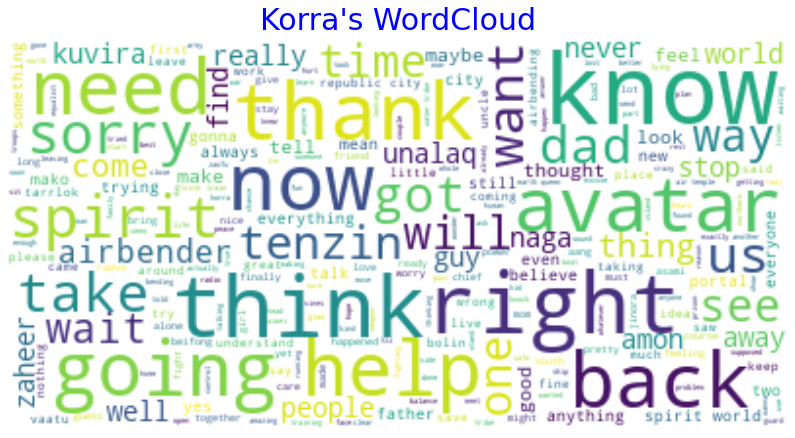

In [157]:
wordcl = WordCloud(stopwords = stopwords, background_color='white', max_font_size = 50, max_words = 2000).generate(Korra_text)
plt.figure(figsize=(14, 12))
plt.imshow(wordcl, interpolation='bilinear')
plt.title("Korra's WordCloud",
              pad=10.0,
              color='Blue',
              fontdict={
                  'fontsize':30
              })
plt.axis('off')
plt.show()

Check out Tenzin, Avatar and Kuvira out there...

Again, let's put this process into a function to select a given character.

In [158]:
def character_wordcloud(char, max_w=2000):
    '''
    Plot a character's (char) wordcloud with a max of 2000 words by default.
    '''
    text = " ".join(line for line in df_lines[df_lines['Character']==char].script.str.lower())
    
    wordcl = WordCloud(stopwords = stopwords, background_color='white', max_font_size = 50, max_words = max_w).generate(text)
    plt.figure(figsize=(14, 12))
    plt.imshow(wordcl, interpolation='bilinear')
    plt.title(char+"'s WordCloud",
              pad=10.0,
              color='Blue',
              fontdict={
                  'fontsize':30
              })
    plt.axis('off')
    plt.show()

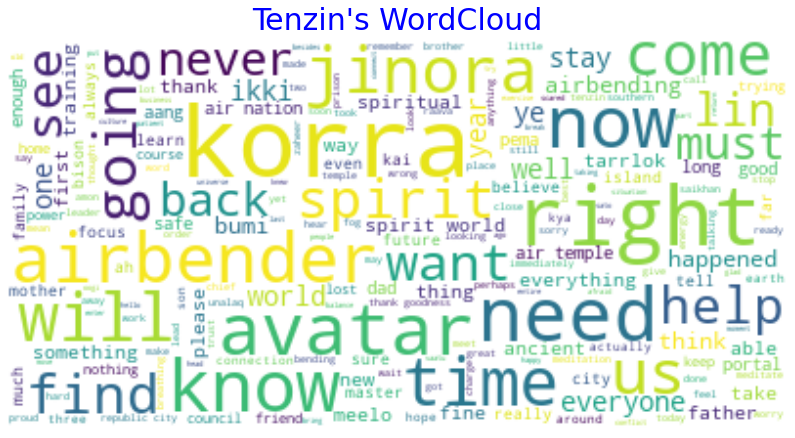

In [159]:
character_wordcloud('Tenzin')

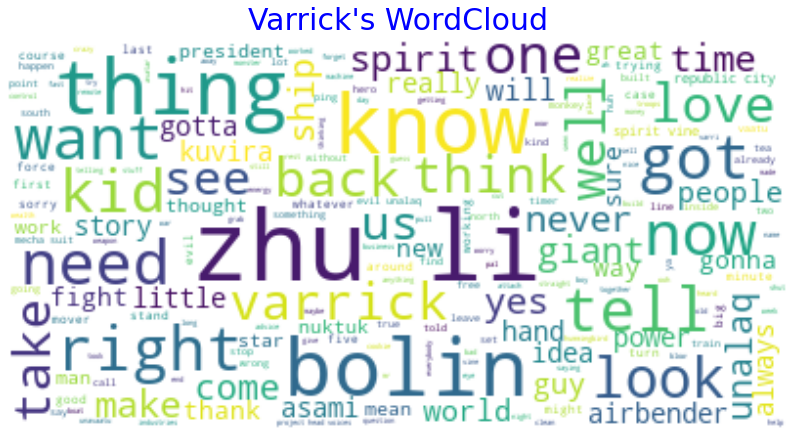

In [160]:
character_wordcloud('Varrick')

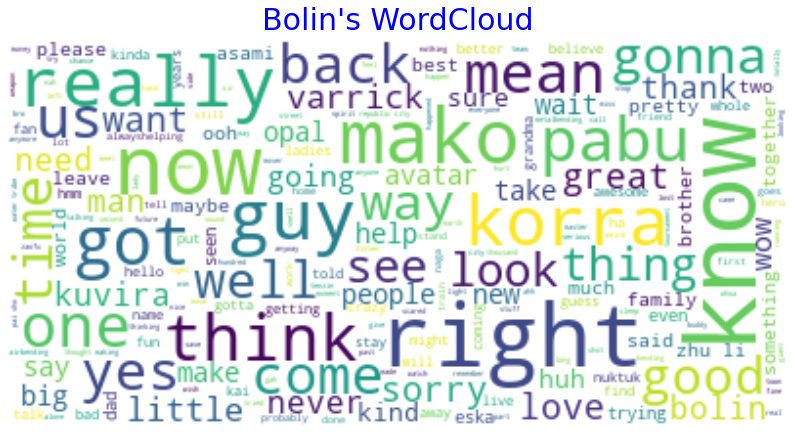

In [161]:
character_wordcloud('Bolin')

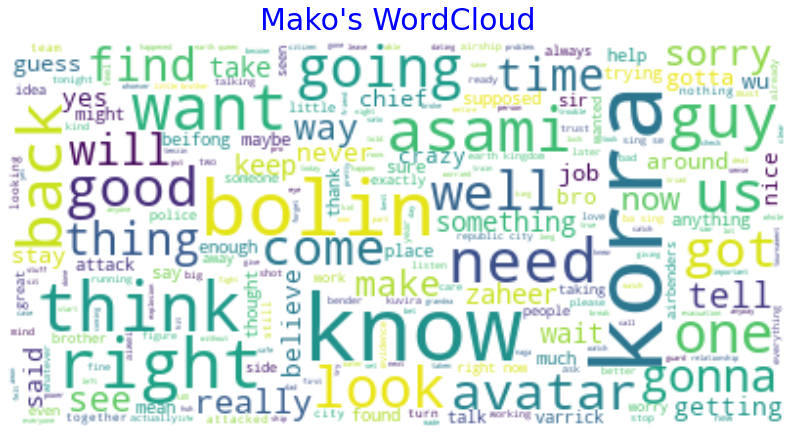

In [162]:
character_wordcloud('Mako')

# Frequency distributions

Let's revisit the frequency distributions using `nltk`. The goal here is to inspect these distributions per character.

In [163]:
from nltk import FreqDist

In [164]:
freq = FreqDist(sum(df_lines['script_clean'].map(word_tokenize), []))

Before turning this into a dataframe, we can inspect the distribution of these most common words:

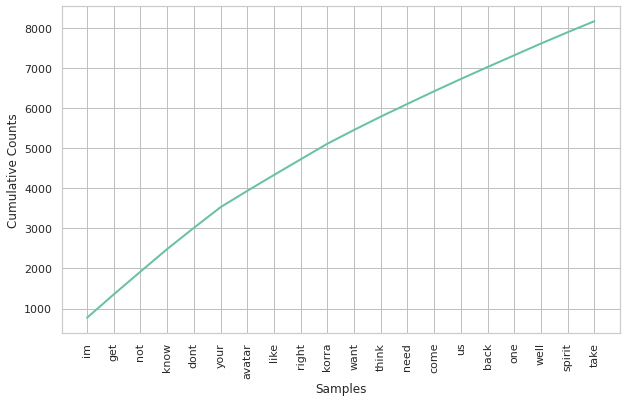

In [165]:
freq.plot(20, cumulative=True);

How many different words are there in the character lines? We'll call this *lexical diversity*.

In [166]:
print(f'Lexical diversity: len(freq)')

Lexical diversity: len(freq)


Now, to turn this into a df object and use it to get an interactive visual with plotly.

In [167]:
freq_df = pd.DataFrame(list(freq.items()), columns = ["Word","Frequency"])

In [168]:
freq_df = freq_df.sort_values(by='Frequency', ascending=False)

In [169]:
freq_df.head(20)

,Word,Frequency
24,im,772
41,get,582
96,not,568
15,know,563
94,dont,529
40,your,515
25,avatar,407
100,like,396
206,right,391
22,korra,389


In [170]:
len(freq_df)

4466

In [171]:
fig = px.bar(freq_df[:20], x = 'Word', y = 'Frequency',
             color=px.colors.qualitative.Light24[:20])
fig.update_layout(
    showlegend=False,
    title="Top 20 more frequent words in character lines",
    xaxis_title="Word",
    yaxis_title="Frequency"
)
fig.show()

We can build a function to get top more frequent words by character:

In [172]:
def character_word_freq_plot(char, top=20):
    '''
    Plot top 'top' more frequent words for character 'char'
    '''
    freq = FreqDist(sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), []))
    freq_df = pd.DataFrame(list(freq.items()), columns = ["Word","Frequency"])
    freq_df = freq_df.sort_values(by='Frequency', ascending=False)
    fig = px.bar(freq_df[:20], x = 'Word', y = 'Frequency',
             color=px.colors.qualitative.Light24[:20])
    fig.update_layout(
        showlegend=False,
        title=f"Top {top} more frequent words for {char}",
        xaxis_title="Word",
        yaxis_title="Frequency"
    )
    fig.show()

In [173]:
character_word_freq_plot('Korra')

In [174]:
character_word_freq_plot('Asami')

In [175]:
character_word_freq_plot('Bolin')

# Bigram Distribution

In [176]:
def character_bigram_plot(char, top=20):
    '''
    Plot top 'top' more frequent bigrams for character 'char'
    '''
    finder = nltk.collocations.BigramCollocationFinder.from_words(sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), []))
    common = finder.ngram_fd.most_common(top)
    
    bigram_list = [(' '.join(el[0]), el[1]) for el in common]
    
    freq_df = pd.DataFrame(bigram_list, columns = ["Bigram","Frequency"])
    freq_df = freq_df.sort_values(by='Frequency', ascending=False)
    fig = px.bar(freq_df[:20], x = 'Bigram', y = 'Frequency',
             color=px.colors.qualitative.Light24[:20])
    fig.update_layout(
        showlegend=False,
        title=f"Top {top} more frequent bigrams for {char}",
        xaxis_title="Bigram",
        yaxis_title="Frequency"
    )
    fig.show()

In [177]:
character_bigram_plot('Korra')

In [178]:
character_bigram_plot('Varrick')

In [179]:
character_bigram_plot('Mako')

In [180]:
character_bigram_plot('Bolin')

# Word and Lexical diversity of characters

In [181]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotu honor famili come thank,0.00,0.000000,13
3,Senna,Welcome.,1,1,1,welcom,0.80,0.900000,2
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investig mani claim northern tribe turn fals,0.05,0.550000,22
7,Senna,"Then you should be happy to know, your search...",1,1,1,happi know search come end,0.80,1.000000,16
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,make sure daughter one,0.50,0.888889,11


## Word diversity

Let's define a function to count the word diversity of a given character.

In [182]:
def word_diversity(char):
    '''
    Return the lexical diversity (an integer number) of a given character (char)
    '''
    text = sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), [])
    return len(set(text))

In [183]:
word_diversity('Korra')

1353

Now, we can create a list of tuples to store these values for each of our top 10 characters:

In [184]:
word_div_by_char = []

for char in top_10_characters.index:
    word_div_by_char.append( (char , word_diversity(char)) )

In [185]:
word_div_by_char

[('Korra', 1353),
 ('Mako', 1123),
 ('Bolin', 1397),
 ('Tenzin', 1120),
 ('Asami', 698),
 ('Lin', 683),
 ('Varrick', 1031),
 ('Suyin', 562),
 ('Kuvira', 598),
 ('Bumi', 506)]

In [186]:
word_df = pd.DataFrame(word_div_by_char, columns=['Character', 'word_diversity'])
word_df

,Character,word_diversity
0,Korra,1353
1,Mako,1123
2,Bolin,1397
3,Tenzin,1120
4,Asami,698
5,Lin,683
6,Varrick,1031
7,Suyin,562
8,Kuvira,598
9,Bumi,506


In [187]:
fig = px.bar(word_df.sort_values(by='word_diversity', ascending=False),
             x = 'Character', y = 'word_diversity',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Word diversity for top 10 characters",
    xaxis_title="Character",
    yaxis_title="Word Diversity"
)
fig.show()

## Lexical diversity

Similarly, we can create a function and a visual for the lexical diversity (fraction of different words by the total number of words) for each character.

In [188]:
def lexical_diversity(char):
    '''
    Return the lexical diversity (netween 0 and 1) of a given character (char)
    '''
    text = sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), [])
    return len(set(text))/len(text)

In [189]:
lexical_diversity('Korra')

0.17553191489361702

In [190]:
lexical_div_by_char = []

for char in top_10_characters.index:
    lexical_div_by_char.append( (char , lexical_diversity(char)) )
    
lexical_df = pd.DataFrame(lexical_div_by_char, columns=['Character', 'lexical_diversity'])
lexical_df

,Character,lexical_diversity
0,Korra,0.175532
1,Mako,0.263491
2,Bolin,0.284637
3,Tenzin,0.295827
4,Asami,0.413018
5,Lin,0.434202
6,Varrick,0.425330
7,Suyin,0.444972
8,Kuvira,0.443950
9,Bumi,0.568539


In [191]:
fig = px.bar(lexical_df.sort_values(by='lexical_diversity', ascending=False),
             x = 'Character', y = 'lexical_diversity',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Lexical diversity for top 10 characters",
    xaxis_title="Character",
    yaxis_title="Lexical Diversity"
)
fig.show()

## Word diversity per Book

We can check the evolution of word diversity in each book.

In [192]:
def word_diversity_book(book):
    '''
    Return the word diversity (an integer number) of a given book (char)
    '''
    text = sum(df_lines[df_lines['Book']==book]['script_clean'].map(word_tokenize), [])
    return len(set(text))

In [194]:
word_div_by_book = []

for i in [1, 2, 3, 4]:
    word_div_by_book.append((i, word_diversity_book(i)))

word_df_book = pd.DataFrame(word_div_by_book,
                            columns=['Book', 'word_diversity'])
word_df_book

,Book,word_diversity
0,1,2270
1,2,1983
2,3,2139
3,4,2325


In [195]:
fig = px.bar(word_df_book.sort_values(by='word_diversity', ascending=False),
             x = 'Book', y = 'word_diversity',
             color=px.colors.qualitative.Light24[:4])
fig.update_layout(
    showlegend=False,
    title="Word diversity for all Books",
    xaxis_title="Book",
    yaxis_title="Word Diversity"
)
fig.show()

## Word diversity per episode

Let's build a graph for the evolution of word diversity of each of the top 10 characters with more lines per episode. The idea here will be very similar to what we've done with the evolution of polarity, subjectivity and word count.

In [196]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Tonraq,The White Lotus has honored my family by comin...,1,1,1,white lotu honor famili come thank,0.00,0.000000,13
3,Senna,Welcome.,1,1,1,welcom,0.80,0.900000,2
5,White Lotus leader,"We have investigated many claims, both here an...",1,1,1,investig mani claim northern tribe turn fals,0.05,0.550000,22
7,Senna,"Then you should be happy to know, your search...",1,1,1,happi know search come end,0.80,1.000000,16
8,White Lotus leader,What makes you so sure your daughter is the one?,1,1,1,make sure daughter one,0.50,0.888889,11


In [197]:
def get_word_div_per_episode(char):
    '''
    Returns the evolution of word diversity by episode for a given character
    '''
    
    word_div_episode = []
    for i in df_lines['total_number'].unique():
        text = sum(df_lines[(df_lines['Character']==char) & (df_lines['total_number']==i)]['script_clean'].map(word_tokenize), [])
        word_div_episode.append((i, len(set(text))))
        
    df = pd.DataFrame(word_div_episode, columns=['episode', 'word_diversity'])        

    return df

In [198]:
korras_word_div = get_word_div_per_episode('Korra')

In [199]:
korras_word_div

,episode,word_diversity
0,1,225
1,2,220
2,3,152
3,4,119
4,5,173
5,6,105
6,7,146
7,8,191
8,9,45
9,10,62


In [202]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x = get_word_div_per_episode(char)['episode'],
                    y = get_word_div_per_episode(char)['word_diversity'],
                    hovertext=list(zip(get_word_div_per_episode(char)['episode'],
                                  get_word_div_per_episode(char)['word_diversity'])),
                    name = char)
fig.update_layout(
    title="Evolution of word diversity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Word diversity of lines",
    hovermode="x unified"
    )

fig.add_vrect(
    # Add background color for Book 1
    x0=1,
    x1=12,
    fillcolor="LightBlue",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=12,
    x1=26,
    fillcolor="LightGreen",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=26,
    x1=39,
    fillcolor="Red",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 4
    x0=39,
    x1=52,
    fillcolor="LightYellow",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_annotation(x=4,
                   y=250,
                   text="Book 1",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="Blue"))
fig.add_annotation(x=14,
                   y=250,
                   text="Book 2",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="DarkGreen"))
fig.add_annotation(x=30,
                   y=250,
                   text="Book 3",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="crimson"))

fig.add_annotation(x=42,
                   y=250,
                   text="Book 4",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="sandybrown"))


fig.show()

There is a huge peak for Varrick with 305 different words in a single episode! Let's find out which one.

Using the hover information, we see it is episode 47:

In [203]:
get_character_lines_episode(['Varrick'], 47)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
8693,Varrick,Not me! I've spent the last few hours tuning...,8,4,47,not ive spent last hour tune incred bore stori,-0.325000,0.316667,18
8695,Varrick,All the while mentally composing the most ex...,8,4,47,mental compos excit tale ever told soon becom ...,0.449554,0.578571,52
8697,Varrick,"Both. It's your true story, but we'll capital...",8,4,47,true stori well capit audienc nuktuk franchis duh,-0.012500,0.625000,22
8699,Varrick,Nyahbabababab! You're emphasizing the wrong st...,8,4,47,nyahbabababab your emphas wrong stori bead tel...,0.251786,0.735714,66
8701,Varrick,Wrong! They're all the same man! Me! I try to...,8,4,47,wrong theyr man tri teach swami power levit he...,0.090000,0.785000,95
8710,Varrick,"You're on-screen talent, kid. Leave the storyt...",8,4,47,your onscreen talent kid leav storytel master ...,-0.309091,0.612338,118
8712,Varrick,How do you think?,8,4,47,think,0.000000,0.000000,5
8722,Varrick,Amon! The reanimated zombie body of the bloo...,8,4,47,amon reanim zombi bodi bloodbend leader equalist,0.000000,0.000000,14
8726,Varrick,The evil Unalaq. The diabolical but incredibl...,8,4,47,evil unalaq diabol incred bore unpopular sorce...,-0.718750,0.791667,25
8729,Varrick,"Yes, Bolin had a reputation as the world's gre...",8,4,47,ye bolin reput world greatest ladi man,1.000000,1.000000,15


In [204]:
len(get_character_lines_episode(['Varrick'], 47))

16

Varrick has 16 lines in this episode. The episode name can be checked with our helper function:

In [205]:
check_episode(8,4)

'Remembrances'


## Lexical diversity per episode

We can do the same process to get the lexical diversity per episode:

In [206]:
def get_lex_div_per_episode(char):
    '''
    Returns the evolution of lexical diversity by episode for a given character
    '''
    
    lex_div_episode = []
    for i in df_lines['total_number'].unique():
        text = sum(df_lines[(df_lines['Character']==char) & (df_lines['total_number']==i)]['script_clean'].map(word_tokenize), [])
        try:
            lex_div_episode.append( (i, len(set(text))/len(text)) )
        except:
            lex_div_episode.append( (i, 0) )
        
    df = pd.DataFrame(lex_div_episode, columns=['episode', 'lexical_diversity'])        

    return df

In [209]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x = get_lex_div_per_episode(char)['episode'],
                    y = get_lex_div_per_episode(char)['lexical_diversity'],
                    hovertext=list(zip(get_lex_div_per_episode(char)['episode'],
                                  get_lex_div_per_episode(char)['lexical_diversity'])),
                    name = char)
fig.update_layout(
    title="Evolution of lexical diversity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Lexical diversity of lines",
    hovermode="x unified"
    )

fig.add_vrect(
    # Add background color for Book 1
    x0=1,
    x1=12,
    fillcolor="LightBlue",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=12,
    x1=26,
    fillcolor="LightGreen",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=26,
    x1=39,
    fillcolor="Red",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 4
    x0=39,
    x1=52,
    fillcolor="LightYellow",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_annotation(x=4,
                   y=1,
                   text="Book 1",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="Blue"))
fig.add_annotation(x=14,
                   y=1,
                   text="Book 2",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="DarkGreen"))
fig.add_annotation(x=30,
                   y=1,
                   text="Book 3",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="crimson"))

fig.add_annotation(x=42,
                   y=1,
                   text="Book 4",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="sandybrown"))

fig.show()

# Saving our dataframe

To reuse our dataframe with all our preprocessing, we'll dump `df_lines` into a pickled object.

In [210]:
with open('./data/df_lines_korra.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(df_lines, filehandle)

# Ending the EDA (for now?)



# Try to classify text

Can we build a model to classify if text belongs to Aang or Korra?
Basic idea [here](https://realpython.com/python-keras-text-classification/).